# Docling IBM Models — 직접 OCR 실험

Docling 고수준 파이프라인 대신 **docling-ibm-models**를 직접 사용하여
PDF 페이지 레이아웃 분석 및 테이블 구조 추출을 수행합니다.

## 모델 구성
| 모델 | 역할 | HuggingFace |
|------|------|-------------|
| **LayoutPredictor** | 페이지 레이아웃 감지 (text/table/figure bbox) | `ds4sd/docling-layout-egret-large` |
| **TableFormer** | 테이블 셀 구조 분석 | `ds4sd/docling-models` (tableformer) |

## 사전 준비
- FastAPI 서버 실행 불필요 (직접 모델 호출)
- AWS 자격증명 필요 (S3 접근)
- 첫 실행 시 HuggingFace에서 모델 자동 다운로드 (~수 GB)

## 1. 라이브러리 임포트 및 설정

In [25]:
import logging
import time
import tempfile
from pathlib import Path

import fitz  # PyMuPDF
import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Image as IPImage
from huggingface_hub import snapshot_download

from pdf_parser.s3_handler import S3Handler

# 로깅 설정
logging.basicConfig(level=logging.INFO, format='%(asctime)s %(levelname)s %(name)s — %(message)s')
logger = logging.getLogger('docling_ibm_ocr')

# S3 핸들러
s3 = S3Handler()

# 디바이스 설정
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_THREADS = 4


print(f'✅ 라이브러리 로드 완료')
print(f'   Device: {DEVICE}')
print(f'   PyTorch: {torch.__version__}')

✅ 라이브러리 로드 완료
   Device: cpu
   PyTorch: 2.10.0+cu128


## 2. 모델 다운로드 (HuggingFace)

첫 실행 시 자동 다운로드됩니다. 이후에는 캐시에서 로드됩니다.

In [26]:
# Layout 모델 다운로드
# egret-large: 정확도 높은 대형 모델
# egret-medium / egret-small: 속도 우선
LAYOUT_MODEL_REPO = 'ds4sd/docling-layout-egret-large'

print(f'📥 Layout 모델 다운로드 중: {LAYOUT_MODEL_REPO}')
t0 = time.time()
layout_artifact_path = snapshot_download(repo_id=LAYOUT_MODEL_REPO)
print(f'✅ 완료 ({time.time() - t0:.1f}초)')
print(f'   저장 경로: {layout_artifact_path}')

📥 Layout 모델 다운로드 중: ds4sd/docling-layout-egret-large


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

✅ 완료 (0.5초)
   저장 경로: /home/ubuntu/.cache/huggingface/hub/models--ds4sd--docling-layout-egret-large/snapshots/53629b541a3ebc817728ee4f81f7750ed0f00341


## 3. LayoutPredictor 초기화

In [27]:
from docling_ibm_models.layoutmodel.layout_predictor import LayoutPredictor

print(f'🔧 LayoutPredictor 초기화...')
t0 = time.time()

layout_predictor = LayoutPredictor(
    artifact_path=layout_artifact_path,
    device=DEVICE,
    num_threads=NUM_THREADS,
    base_threshold=0.3,  # confidence 임계값
)

print(f'✅ 초기화 완료 ({time.time() - t0:.1f}초)')
print(f'   Info: {layout_predictor.info()}')

🔧 LayoutPredictor 초기화...
✅ 초기화 완료 (0.2초)
   Info: {'model_name': 'DFineForObjectDetection', 'safe_tensors_file': '/home/ubuntu/.cache/huggingface/hub/models--ds4sd--docling-layout-egret-large/snapshots/53629b541a3ebc817728ee4f81f7750ed0f00341/model.safetensors', 'device': 'cpu', 'num_threads': 4, 'image_size': {'height': 640, 'width': 640}, 'threshold': 0.3}


## 4. S3에서 PDF 다운로드

In [28]:
# 분석할 PDF S3 경로
S3_PDF_PATH = 's3://miraeasset-product-knowledge-graph/zeroin/r3/R3_A0018Z0_001.pdf'
DPI = 150  # 페이지 이미지 해상도 (높을수록 정확하지만 느림)

print(f'📥 PDF 다운로드: {S3_PDF_PATH}')

temp_dir = Path(tempfile.mkdtemp(prefix='ibm_ocr_'))
local_pdf = temp_dir / Path(S3_PDF_PATH).name

bucket, key = s3.parse_s3_uri(S3_PDF_PATH)
resp = s3._client.get_object(Bucket=bucket, Key=key)
local_pdf.write_bytes(resp['Body'].read())

print(f'✅ 다운로드 완료: {local_pdf.name} ({local_pdf.stat().st_size / 1024:.0f} KB)')

# PDF 페이지를 이미지로 변환
print(f'\n🖼️  PDF → 이미지 변환 (DPI={DPI})...')
doc = fitz.open(local_pdf)
page_images = []

for page_num in range(len(doc)):
    page = doc[page_num]
    mat = fitz.Matrix(DPI / 72, DPI / 72)
    pix = page.get_pixmap(matrix=mat)
    img = Image.frombytes('RGB', [pix.width, pix.height], pix.samples)
    page_images.append(img)
    print(f'   페이지 {page_num + 1}: {img.width} x {img.height} px')

doc.close()
print(f'\n✅ 총 {len(page_images)}페이지 변환 완료')

📥 PDF 다운로드: s3://miraeasset-product-knowledge-graph/zeroin/r3/R3_A0018Z0_001.pdf
✅ 다운로드 완료: R3_A0018Z0_001.pdf (526 KB)

🖼️  PDF → 이미지 변환 (DPI=150)...
   페이지 1: 1241 x 1754 px
   페이지 2: 1241 x 1754 px
   페이지 3: 1241 x 1754 px
   페이지 4: 1241 x 1754 px

✅ 총 4페이지 변환 완료


## 5. 레이아웃 분석 (LayoutPredictor)

각 페이지에서 **텍스트/테이블/그림** 영역의 바운딩 박스를 감지합니다.

In [29]:
# 레이아웃 예측
print('🔍 레이아웃 분석 시작...')
print('=' * 80)

all_predictions = []  # 페이지별 예측 결과

t_total = time.time()
for page_num, img in enumerate(page_images):
    t0 = time.time()
    preds = list(layout_predictor.predict(img))
    elapsed = time.time() - t0
    all_predictions.append(preds)

    # 레이블별 카운트
    from collections import Counter
    label_counts = Counter(p['label'] for p in preds)

    print(f'\n📄 페이지 {page_num + 1} ({elapsed:.1f}초)')
    print(f'   총 {len(preds)}개 요소 감지')
    for label, count in sorted(label_counts.items()):
        print(f'   - {label}: {count}개')

print(f'\n✅ 전체 완료 ({time.time() - t_total:.1f}초)')

🔍 레이아웃 분석 시작...

📄 페이지 1 (2.1초)
   총 79개 요소 감지
   - Footnote: 8개
   - Key-Value Region: 3개
   - List-item: 8개
   - Page-header: 4개
   - Picture: 2개
   - Section-header: 15개
   - Table: 6개
   - Text: 32개
   - Title: 1개

📄 페이지 2 (2.1초)
   총 38개 요소 감지
   - List-item: 9개
   - Section-header: 3개
   - Table: 3개
   - Text: 23개

📄 페이지 3 (2.1초)
   총 1개 요소 감지
   - Table: 1개

📄 페이지 4 (2.1초)
   총 23개 요소 감지
   - Key-Value Region: 2개
   - List-item: 9개
   - Section-header: 1개
   - Table: 1개
   - Text: 10개

✅ 전체 완료 (8.4초)


## 6. 바운딩 박스 시각화

🎨 색상 범례
  Table                     RGB(255, 60, 60)
  Table rotated             RGB(255,140,  0)
  Picture                   RGB( 50,200, 50)
  Figure                    RGB( 50,200, 50)
  Text                      RGB( 70,130,255)
  Title                     RGB(160,  0,220)
  Section-header            RGB(180, 80,255)
  List-item                 RGB(  0,195,195)
  Formula                   RGB(255, 20,147)
  Code                      RGB(128,128,  0)
  Page-header               RGB(160,160,160)
  Page-footer               RGB(100,100,100)
  Caption                   RGB(255,200,  0)
  Footnote                  RGB(160, 82, 45)
  Document Index            RGB(  0,160, 80)
  Checkbox-Selected         RGB(  0,180,255)
  Checkbox-Unselected       RGB(130,180,255)
  Form                      RGB(255,120,  0)
  Key-Value Region          RGB(200,100,  0)

📋 이 PDF에서 실제 감지된 레이블: ['Footnote', 'Key-Value Region', 'List-item', 'Page-header', 'Picture', 'Section-header', 'Table', 'Text', 'Title'

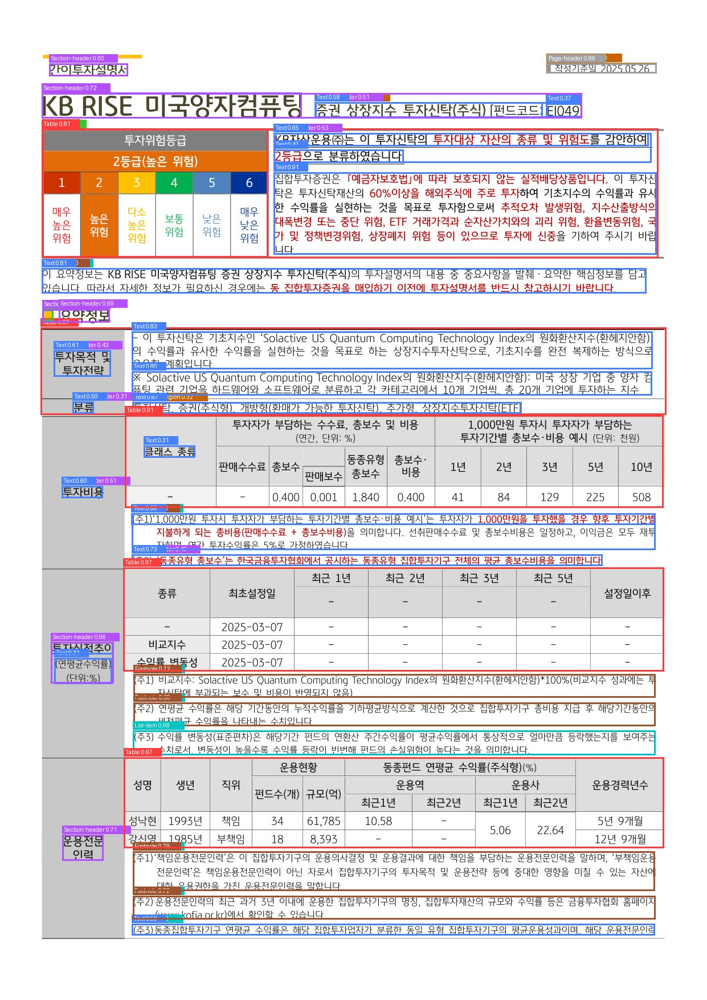


📄 페이지 2 — List-item:9, Section-header:3, Table:3, Text:23


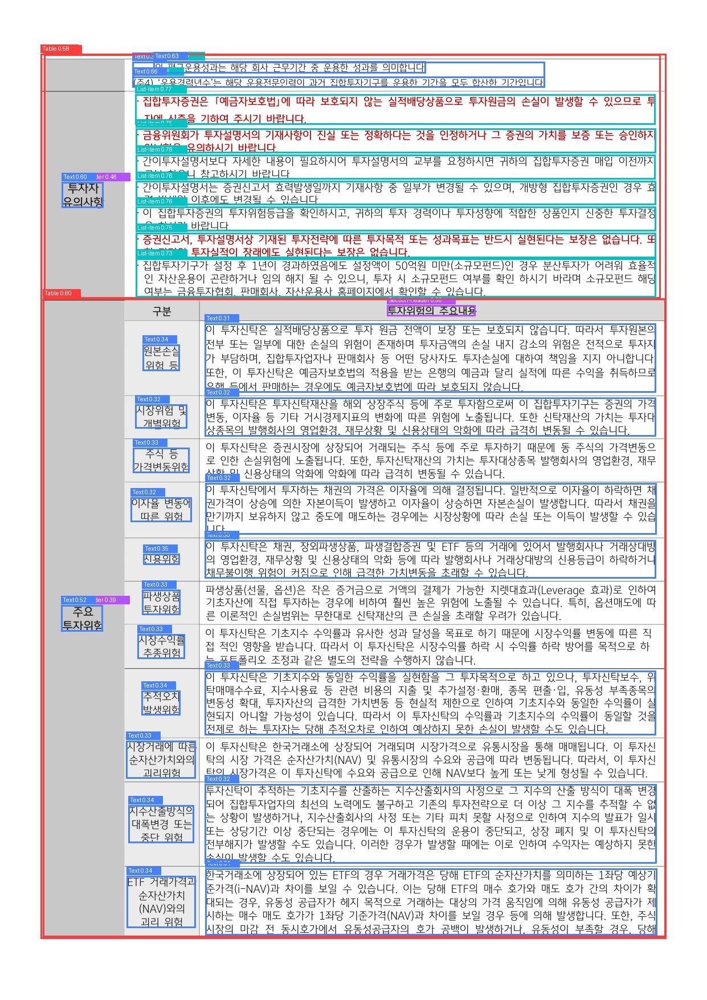


📄 페이지 3 — Table:1


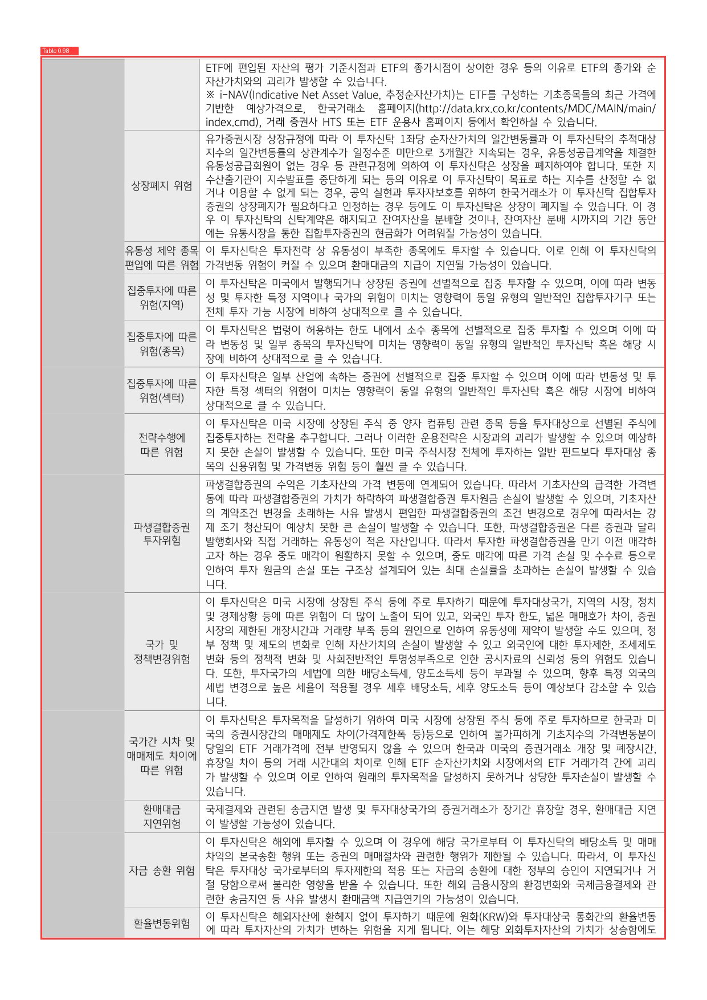


📄 페이지 4 — Key-Value Region:2, List-item:9, Section-header:1, Table:1, Text:10


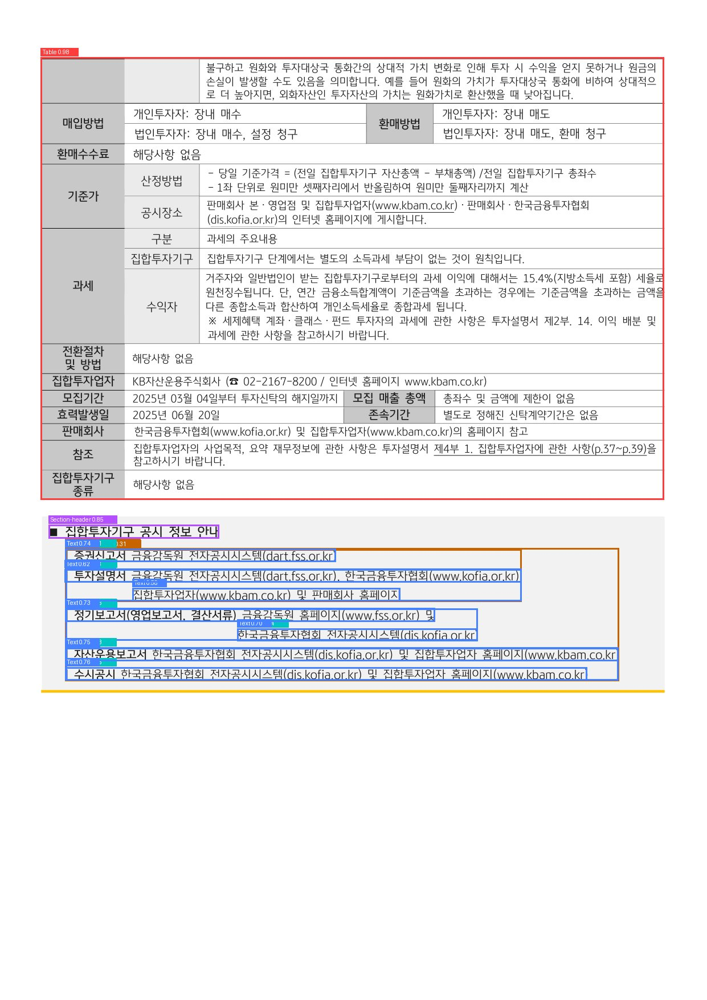

In [30]:
# 레이블별 색상 정의 (LayoutPredictor 실제 레이블명 기준)
LABEL_COLORS = {
    'Table':               (255,  60,  60),   # 빨강
    'Table rotated':       (255, 140,   0),   # 주황
    'Picture':             ( 50, 200,  50),   # 초록
    'Figure':              ( 50, 200,  50),   # 초록
    'Text':                ( 70, 130, 255),   # 파랑
    'Title':               (160,   0, 220),   # 보라
    'Section-header':      (180,  80, 255),   # 연보라
    'List-item':           (  0, 195, 195),   # 청록
    'Formula':             (255,  20, 147),   # 핑크
    'Code':                (128, 128,   0),   # 올리브
    'Page-header':         (160, 160, 160),   # 회색
    'Page-footer':         (100, 100, 100),   # 진회색
    'Caption':             (255, 200,   0),   # 골드
    'Footnote':            (160,  82,  45),   # 갈색
    'Document Index':      (  0, 160,  80),   # 진초록
    'Checkbox-Selected':   (  0, 180, 255),   # 하늘
    'Checkbox-Unselected': (130, 180, 255),   # 연하늘
    'Form':                (255, 120,   0),   # 주황
    'Key-Value Region':    (200, 100,   0),   # 갈주황
}
DEFAULT_COLOR = (180, 180, 180)


def draw_layout_predictions(img: Image.Image, preds: list, min_confidence: float = 0.3) -> Image.Image:
    """이미지에 레이아웃 예측 결과를 시각화."""
    viz = img.copy().convert('RGB')
    draw = ImageDraw.Draw(viz)

    for pred in sorted(preds, key=lambda p: p['confidence']):
        if pred['confidence'] < min_confidence:
            continue

        label = pred['label']
        conf = pred['confidence']
        l, t, r, b = int(pred['l']), int(pred['t']), int(pred['r']), int(pred['b'])
        color = LABEL_COLORS.get(label, DEFAULT_COLOR)

        # 박스 그리기 (두께 3)
        draw.rectangle([l, t, r, b], outline=color, width=3)

        # 레이블 텍스트 배경
        text = f'{label} {conf:.2f}'
        text_w = len(text) * 6 + 6
        text_h = 14
        label_y = t - text_h - 2 if t > text_h + 2 else b + 2

        draw.rectangle([l, label_y, l + text_w, label_y + text_h], fill=color)
        draw.text((l + 3, label_y + 1), text, fill='white')

    return viz


# 범례 출력
print('🎨 색상 범례')
print('=' * 60)
for label, color in LABEL_COLORS.items():
    r, g, b = color
    print(f'  {label:<25} RGB({r:3d},{g:3d},{b:3d})')

# 실제 감지된 레이블 확인
all_labels_seen = sorted(set(p['label'] for preds in all_predictions for p in preds))
print(f'\n📋 이 PDF에서 실제 감지된 레이블: {all_labels_seen}')
unknown = [l for l in all_labels_seen if l not in LABEL_COLORS]
if unknown:
    print(f'⚠️  색상 미정의 레이블: {unknown} → 회색 적용')

# 각 페이지 시각화
viz_dir = temp_dir / 'viz'
viz_dir.mkdir(exist_ok=True)

for page_num, (img, preds) in enumerate(zip(page_images, all_predictions)):
    viz = draw_layout_predictions(img, preds, min_confidence=0.3)
    viz_path = viz_dir / f'page_{page_num + 1:02d}_layout.jpg'
    viz.save(viz_path, 'JPEG', quality=85)

    label_counts = Counter(p['label'] for p in preds if p['confidence'] >= 0.3)
    summary = ', '.join(f'{k}:{v}' for k, v in sorted(label_counts.items()))

    print(f'\n{"=" * 80}')
    print(f'📄 페이지 {page_num + 1} — {summary}')
    print(f'{"=" * 80}')
    display(IPImage(filename=str(viz_path), width=800))

## 7. 테이블 영역 상세 분석

감지된 테이블 영역을 크롭하여 상세 확인합니다.

📊 테이블 영역 분석

📄 페이지 1: 테이블 6개
   테이블 1: confidence=0.970, 크기=948x159px, 위치=75.7%~84.8%


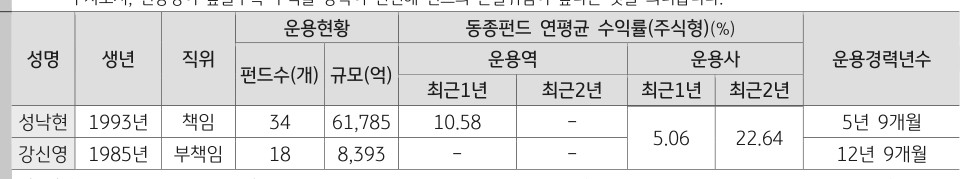

   테이블 2: confidence=0.967, 크기=949x182px, 위치=56.7%~67.1%


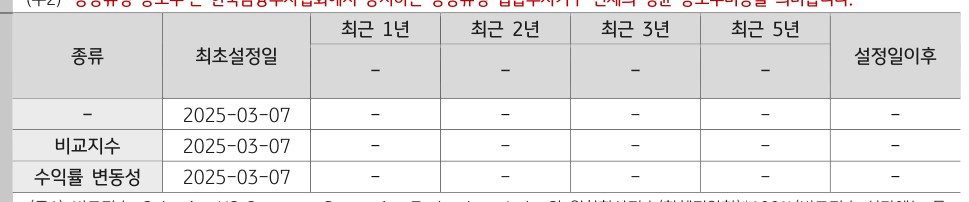

   테이블 3: confidence=0.910, 크기=945x162px, 위치=41.5%~50.7%


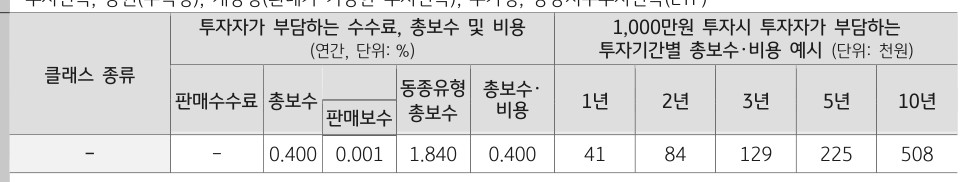

   테이블 4: confidence=0.813, 크기=397x225px, 위치=12.9%~25.7% ⚠️ 페이지 상단 (cross-page 후보)


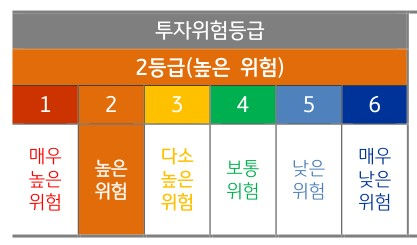

   테이블 5: confidence=0.407, 크기=1081x227px, 위치=12.8%~25.8% ⚠️ 페이지 상단 (cross-page 후보)


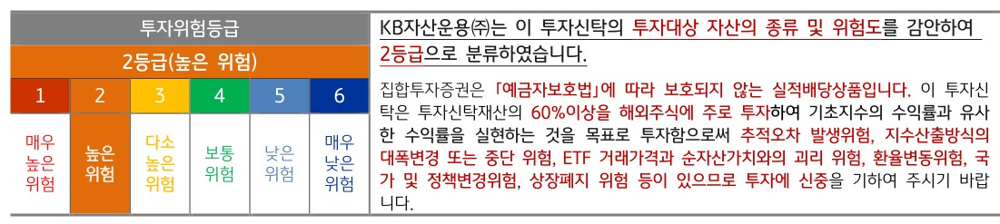

   테이블 6: confidence=0.369, 크기=1098x153px, 위치=32.7%~41.4%


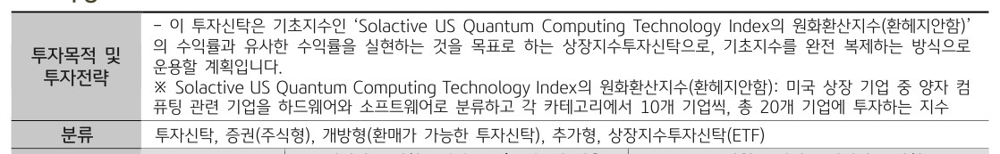


📄 페이지 2: 테이블 3개
   테이블 1: confidence=0.800, 크기=1093x1120px, 위치=29.8%~93.7% ⚠️ 페이지 하단 (cross-page 후보)


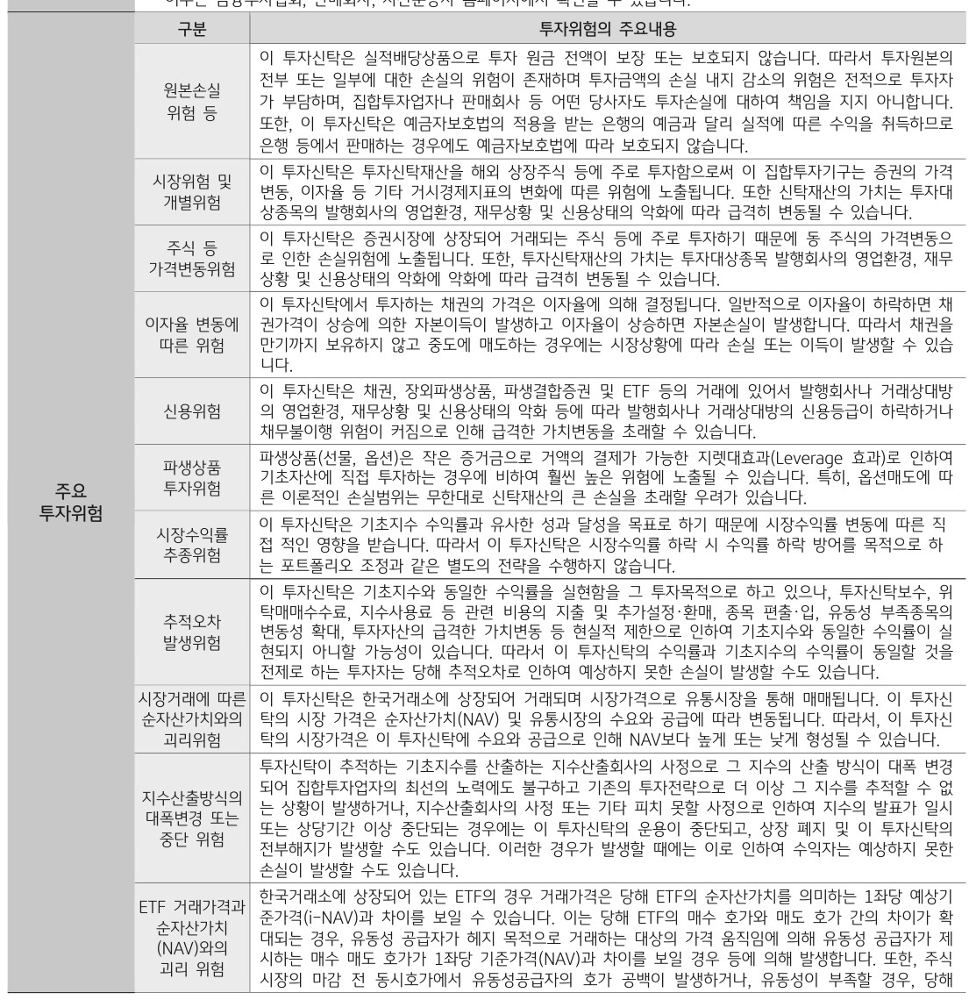

   테이블 2: confidence=0.583, 크기=1098x1552px, 위치=5.4%~93.8% ⚠️ 페이지 하단 (cross-page 후보)


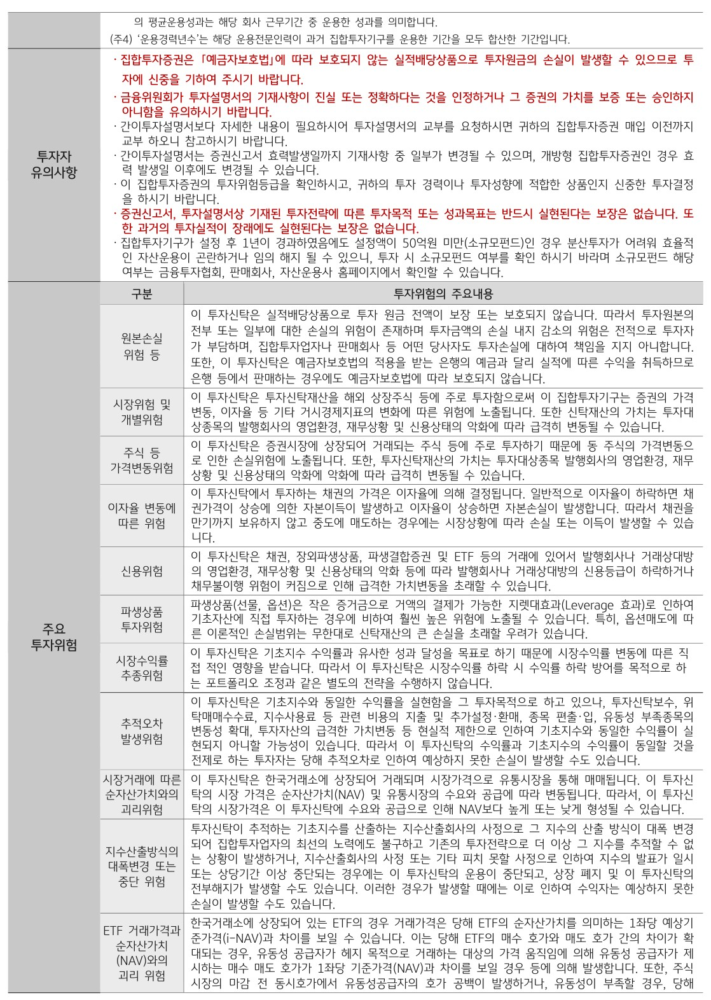

   테이블 3: confidence=0.314, 크기=1082x428px, 위치=5.4%~29.8% ⚠️ 페이지 상단 (cross-page 후보)


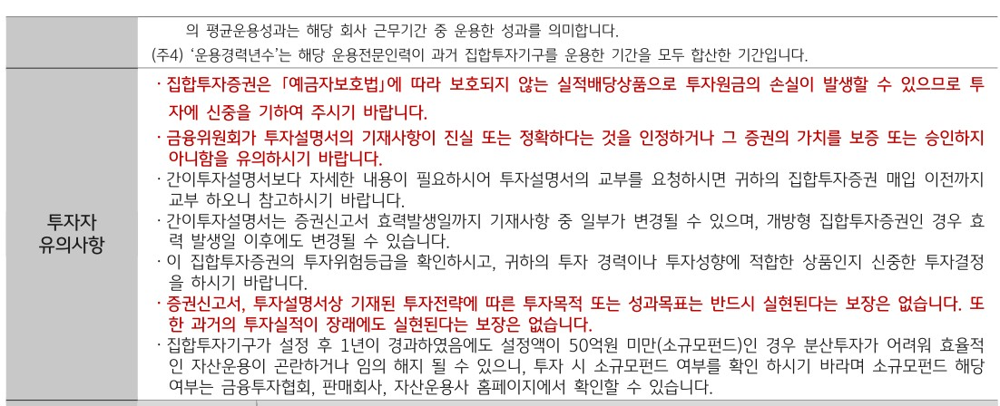


📄 페이지 3: 테이블 1개
   테이블 1: confidence=0.981, 크기=1097x1549px, 위치=5.6%~93.9% ⚠️ 페이지 하단 (cross-page 후보)


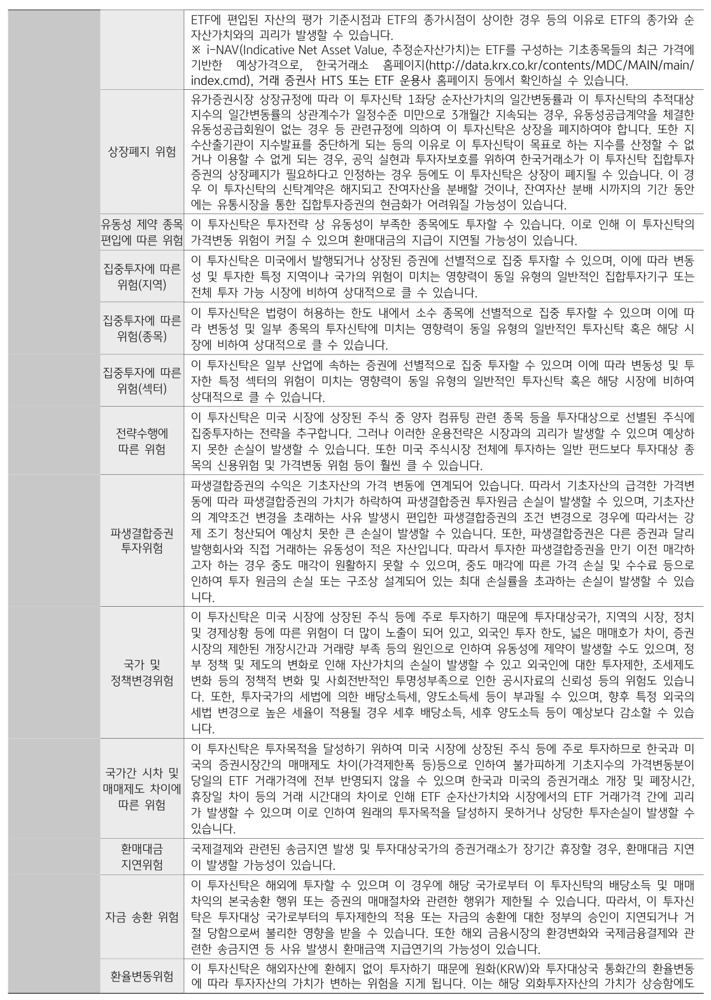


📄 페이지 4: 테이블 1개
   테이블 1: confidence=0.978, 크기=1094x776px, 위치=5.7%~49.9% ⚠️ 페이지 상단 (cross-page 후보)


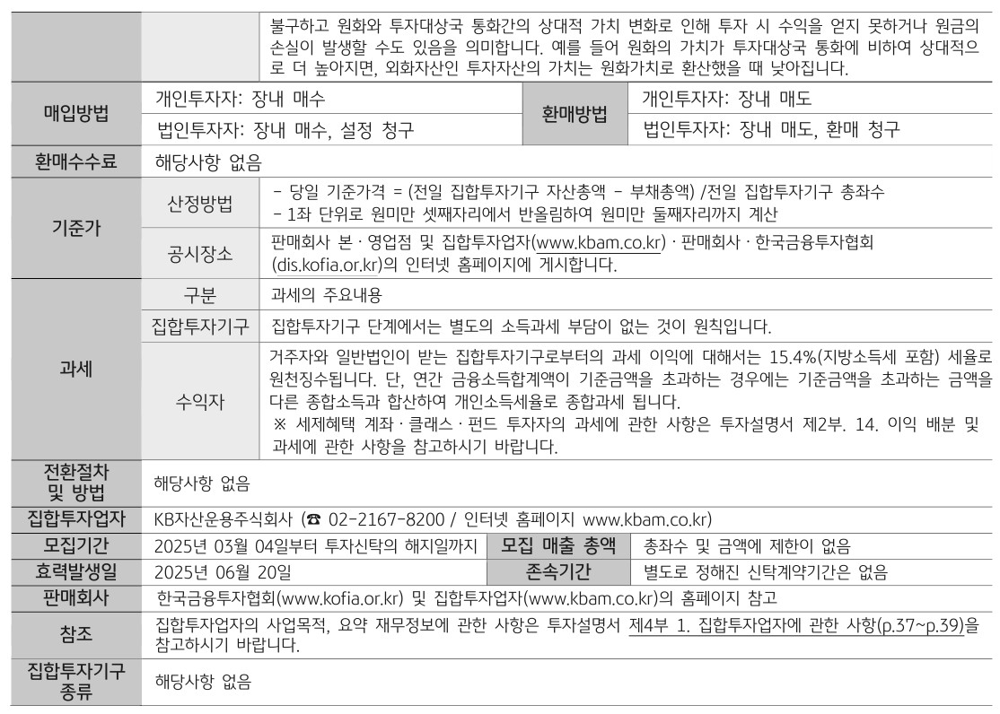


📋 테이블 요약


,page,table_idx,label,confidence,bbox,size,top_%,bottom_%,near_bottom,near_top
0,1,1,Table,0.970,"(217,1328)-(1165,1487)",948x159,75.7%,84.8%,False,False
1,1,2,Table,0.967,"(216,995)-(1165,1177)",949x182,56.7%,67.1%,False,False
2,1,3,Table,0.910,"(219,728)-(1164,890)",945x162,41.5%,50.7%,False,False
3,1,4,Table,0.813,"(73,226)-(470,451)",397x225,12.9%,25.7%,False,True
4,1,5,Table,0.407,"(74,225)-(1155,452)",1081x227,12.8%,25.8%,False,True
5,1,6,Table,0.369,"(71,574)-(1169,727)",1098x153,32.7%,41.4%,False,False
6,2,1,Table,0.800,"(75,523)-(1168,1643)",1093x1120,29.8%,93.7%,True,False
7,2,2,Table,0.583,"(71,94)-(1169,1646)",1098x1552,5.4%,93.8%,True,True
8,2,3,Table,0.314,"(77,95)-(1159,523)",1082x428,5.4%,29.8%,False,True
9,3,1,Table,0.981,"(71,98)-(1168,1647)",1097x1549,5.6%,93.9%,True,True



⚠️  Cross-page 테이블 후보:
   하단 테이블: 3개
   상단 테이블: 6개


In [31]:
import pandas as pd

print('📊 테이블 영역 분석')
print('=' * 80)

table_regions = []

for page_num, (img, preds) in enumerate(zip(page_images, all_predictions)):
    tables_on_page = [
        p for p in preds
        if 'table' in p['label'].lower() and p['confidence'] >= 0.3
    ]

    if not tables_on_page:
        continue

    print(f'\n📄 페이지 {page_num + 1}: 테이블 {len(tables_on_page)}개')

    for i, pred in enumerate(tables_on_page):
        l, t, r, b = int(pred['l']), int(pred['t']), int(pred['r']), int(pred['b'])
        w = r - l
        h = b - t
        page_h = img.height

        # 페이지 내 위치 (상단 기준)
        top_pct = t / page_h * 100
        bottom_pct = b / page_h * 100

        table_info = {
            'page': page_num + 1,
            'table_idx': i + 1,
            'label': pred['label'],
            'confidence': f"{pred['confidence']:.3f}",
            'bbox': f'({l},{t})-({r},{b})',
            'size': f'{w}x{h}',
            'top_%': f'{top_pct:.1f}%',
            'bottom_%': f'{bottom_pct:.1f}%',
            'near_bottom': bottom_pct > 85,
            'near_top': top_pct < 15,
        }
        table_regions.append(table_info)

        position_tag = ''
        if table_info['near_bottom']:
            position_tag = ' ⚠️ 페이지 하단 (cross-page 후보)'
        elif table_info['near_top']:
            position_tag = ' ⚠️ 페이지 상단 (cross-page 후보)'

        print(f'   테이블 {i+1}: confidence={pred["confidence"]:.3f}, '
              f'크기={w}x{h}px, 위치={top_pct:.1f}%~{bottom_pct:.1f}%{position_tag}')

        # 크롭 이미지 저장
        margin = 10
        crop = img.crop((
            max(0, l - margin), max(0, t - margin),
            min(img.width, r + margin), min(img.height, b + margin)
        ))
        crop_path = viz_dir / f'page_{page_num + 1:02d}_table_{i + 1:02d}.jpg'
        crop.save(crop_path, 'JPEG', quality=90)
        display(IPImage(filename=str(crop_path), width=600))

# 요약 테이블
if table_regions:
    print('\n' + '=' * 80)
    print('📋 테이블 요약')
    df = pd.DataFrame(table_regions)
    display(df)

    # Cross-page 후보 식별
    bottom_tables = df[df['near_bottom'] == True]
    top_tables = df[df['near_top'] == True]

    if len(bottom_tables) > 0 or len(top_tables) > 0:
        print(f'\n⚠️  Cross-page 테이블 후보:')
        print(f'   하단 테이블: {len(bottom_tables)}개')
        print(f'   상단 테이블: {len(top_tables)}개')
    else:
        print('\n✅ Cross-page 테이블 없음')
else:
    print('\n테이블이 감지되지 않았습니다.')

## 8. 배치 처리 (Batch Predict)

`predict_batch()`를 사용하면 여러 페이지를 한 번에 처리하여 속도를 높일 수 있습니다.

In [32]:
print('🚀 배치 처리 성능 비교')
print('=' * 80)

# 단건 처리 시간
t0 = time.time()
for img in page_images:
    list(layout_predictor.predict(img))
time_single = time.time() - t0

# 배치 처리 시간
t0 = time.time()
batch_results = layout_predictor.predict_batch(page_images)
time_batch = time.time() - t0

print(f'\n   페이지 수: {len(page_images)}개')
print(f'   단건 처리: {time_single:.2f}초 (페이지당 {time_single/len(page_images):.2f}초)')
print(f'   배치 처리: {time_batch:.2f}초 (페이지당 {time_batch/len(page_images):.2f}초)')
print(f'   속도 향상: {time_single/time_batch:.1f}x')

# 결과 검증
match = True
for p_single, p_batch in zip(all_predictions, batch_results):
    if len(p_single) != len(p_batch):
        match = False
        break
print(f'\n   단건/배치 결과 일치: {"✅" if match else "❌"}')

🚀 배치 처리 성능 비교

   페이지 수: 4개
   단건 처리: 7.88초 (페이지당 1.97초)
   배치 처리: 8.41초 (페이지당 2.10초)
   속도 향상: 0.9x

   단건/배치 결과 일치: ✅


## 9. Cross-Page 테이블 감지 통합

LayoutPredictor 결과를 이용하여 **페이지 경계 테이블**을 사전 감지하고,
`table_merger`의 병합 판단에 활용합니다.

In [33]:
def detect_cross_page_candidates(
    all_predictions: list[list[dict]],
    bottom_threshold: float = 0.85,
    top_threshold: float = 0.15,
    page_images: list[Image.Image] = None,
) -> list[tuple[int, int]]:
    """
    Cross-page 테이블 후보 페이지 쌍을 반환.

    Returns:
        List of (page_n, page_n+1) page pairs (0-based)
    """
    candidates = []

    for page_num, preds in enumerate(all_predictions):
        if page_num >= len(all_predictions) - 1:
            break

        img_h = page_images[page_num].height if page_images else 1
        next_img_h = page_images[page_num + 1].height if page_images else 1

        # 현재 페이지 하단 테이블 여부
        has_bottom_table = any(
            'table' in p['label'].lower()
            and p['confidence'] >= 0.3
            and (p['b'] / img_h) > bottom_threshold
            for p in preds
        )

        # 다음 페이지 상단 테이블 여부
        next_preds = all_predictions[page_num + 1]
        has_top_table = any(
            'table' in p['label'].lower()
            and p['confidence'] >= 0.3
            and (p['t'] / next_img_h) < top_threshold
            for p in next_preds
        )

        if has_bottom_table and has_top_table:
            candidates.append((page_num, page_num + 1))

    return candidates


# Cross-page 후보 감지
print('🔍 Cross-Page 테이블 후보 감지')
print('=' * 80)

candidates = detect_cross_page_candidates(
    all_predictions,
    bottom_threshold=0.82,
    top_threshold=0.18,
    page_images=page_images
)

if candidates:
    print(f'\n⚠️  Cross-page 테이블 후보 {len(candidates)}쌍 감지:')
    for p1, p2 in candidates:
        print(f'   페이지 {p1+1} → 페이지 {p2+1}')
    print('\n💡 table_merger가 이 페이지 쌍을 우선적으로 병합 처리합니다.')
else:
    print('\n✅ Cross-page 테이블 없음')
    print('   (하단 85% 이하 테이블 + 다음 페이지 상단 15% 이상 테이블 조건 미충족)')

🔍 Cross-Page 테이블 후보 감지

⚠️  Cross-page 테이블 후보 3쌍 감지:
   페이지 1 → 페이지 2
   페이지 2 → 페이지 3
   페이지 3 → 페이지 4

💡 table_merger가 이 페이지 쌍을 우선적으로 병합 처리합니다.


## 10. 전체 결과 요약

In [34]:
from collections import Counter

print('📊 전체 분석 결과 요약')
print('=' * 80)

# 전체 레이블 통계
all_labels = [p['label'] for preds in all_predictions for p in preds if p['confidence'] >= 0.3]
label_counts = Counter(all_labels)

print(f'\n📄 PDF 정보')
print(f'   파일: {Path(S3_PDF_PATH).name}')
print(f'   총 페이지: {len(page_images)}')

print(f'\n📦 감지된 요소 (confidence ≥ 0.3)')
for label, count in sorted(label_counts.items(), key=lambda x: -x[1]):
    bar = '█' * count
    print(f'   {label:<25} {count:3d}개  {bar}')

print(f'\n🔗 Cross-page 후보: {len(candidates)}쌍')
for p1, p2 in candidates:
    print(f'   페이지 {p1+1} ↔ {p2+1}')

print(f'\n💾 시각화 결과 저장 위치: {viz_dir}')

📊 전체 분석 결과 요약

📄 PDF 정보
   파일: R3_A0018Z0_001.pdf
   총 페이지: 4

📦 감지된 요소 (confidence ≥ 0.3)
   Text                       65개  █████████████████████████████████████████████████████████████████
   List-item                  26개  ██████████████████████████
   Section-header             19개  ███████████████████
   Table                      11개  ███████████
   Footnote                    8개  ████████
   Key-Value Region            5개  █████
   Page-header                 4개  ████
   Picture                     2개  ██
   Title                       1개  █

🔗 Cross-page 후보: 3쌍
   페이지 1 ↔ 2
   페이지 2 ↔ 3
   페이지 3 ↔ 4

💾 시각화 결과 저장 위치: /tmp/ibm_ocr_ft7ue_c6/viz


## 11. 인접 2페이지 병합 OCR 실험 (Cross-Page Table)

이미 로드된 `page_images`를 사용하여 인접 2페이지를 세로로 병합한 이미지에
LayoutPredictor를 실행하고, 원본(페이지별)과 테이블 감지 결과를 비교합니다.

- **(1+2), (2+3), (3+4) ...** 인접 쌍마다 병합 이미지 생성
- 페이지 경계가 사라지므로 cross-page 테이블이 **하나의 Table bbox**로 감지될 것을 기대
- 처리 시간은 원본 대비 약 2배 (이미지 높이 2배)

In [35]:
# 인접 2페이지 병합 이미지 생성 + LayoutPredictor 실행
print('🔗 인접 2페이지 병합 OCR 실험')
print('=' * 80)

merged_pair_results = []  # (pair_label, merged_img, preds, page1_h)

for i in range(len(page_images) - 1):
    img_a = page_images[i]
    img_b = page_images[i + 1]
    pair_label = f'페이지 {i+1}+{i+2}'

    # 세로로 이어붙이기
    max_w = max(img_a.width, img_b.width)
    total_h = img_a.height + img_b.height
    merged = Image.new('RGB', (max_w, total_h), 'white')
    merged.paste(img_a, (0, 0))
    merged.paste(img_b, (0, img_a.height))

    print(f'\n  🖼️  {pair_label}: {max_w}x{total_h}px 병합 이미지 생성')

    # LayoutPredictor 실행
    t0 = time.time()
    preds = list(layout_predictor.predict(merged))
    elapsed = time.time() - t0

    # 테이블 감지 결과
    tables = [p for p in preds if 'Table' in p['label'] and p['confidence'] >= 0.3]
    print(f'     완료 ({elapsed:.1f}초) — 전체 {len(preds)}개 요소, 테이블 {len(tables)}개')

    for t in tables:
        top_pct = t['t'] / total_h * 100
        bot_pct = t['b'] / total_h * 100
        # 페이지 경계(50%) 전후에 걸쳐 있으면 cross-page 테이블
        spans_boundary = t['t'] < (total_h * 0.5) and t['b'] > (total_h * 0.5)
        tag = ' ✅ 경계 통과!' if spans_boundary else ''
        print(f'       Table confidence={t["confidence"]:.3f}, 위치={top_pct:.1f}%~{bot_pct:.1f}%{tag}')

    merged_pair_results.append({
        'label': pair_label,
        'merged_img': merged,
        'preds': preds,
        'page1_h': img_a.height,
        'page2_h': img_b.height,
        'total_h': total_h,
        'page1_idx': i,
        'page2_idx': i + 1,
    })

print(f'\n✅ {len(merged_pair_results)}쌍 처리 완료')

🔗 인접 2페이지 병합 OCR 실험

  🖼️  페이지 1+2: 1241x3508px 병합 이미지 생성
     완료 (2.3초) — 전체 109개 요소, 테이블 5개
       Table confidence=0.938, 위치=28.3%~33.5%
       Table confidence=0.932, 위치=37.9%~42.4%
       Table confidence=0.863, 위치=20.7%~25.3%
       Table confidence=0.489, 위치=6.5%~12.8%
       Table confidence=0.328, 위치=20.7%~25.3%

  🖼️  페이지 2+3: 1241x3508px 병합 이미지 생성
     완료 (2.3초) — 전체 90개 요소, 테이블 3개
       Table confidence=0.500, 위치=15.3%~47.1%
       Table confidence=0.376, 위치=2.7%~47.2%
       Table confidence=0.302, 위치=52.9%~96.9%

  🖼️  페이지 3+4: 1241x3508px 병합 이미지 생성
     완료 (2.4초) — 전체 90개 요소, 테이블 5개
       Table confidence=0.554, 위치=52.8%~74.9%
       Table confidence=0.446, 위치=2.8%~47.0%
       Table confidence=0.374, 위치=67.5%~74.5%
       Table confidence=0.374, 위치=2.9%~46.9%
       Table confidence=0.319, 위치=52.8%~66.9%

✅ 3쌍 처리 완료


📊 원본 vs 병합 — 테이블 감지 비교 시각화

🔗 페이지 1+2

  1️⃣  원본 (페이지별 감지)


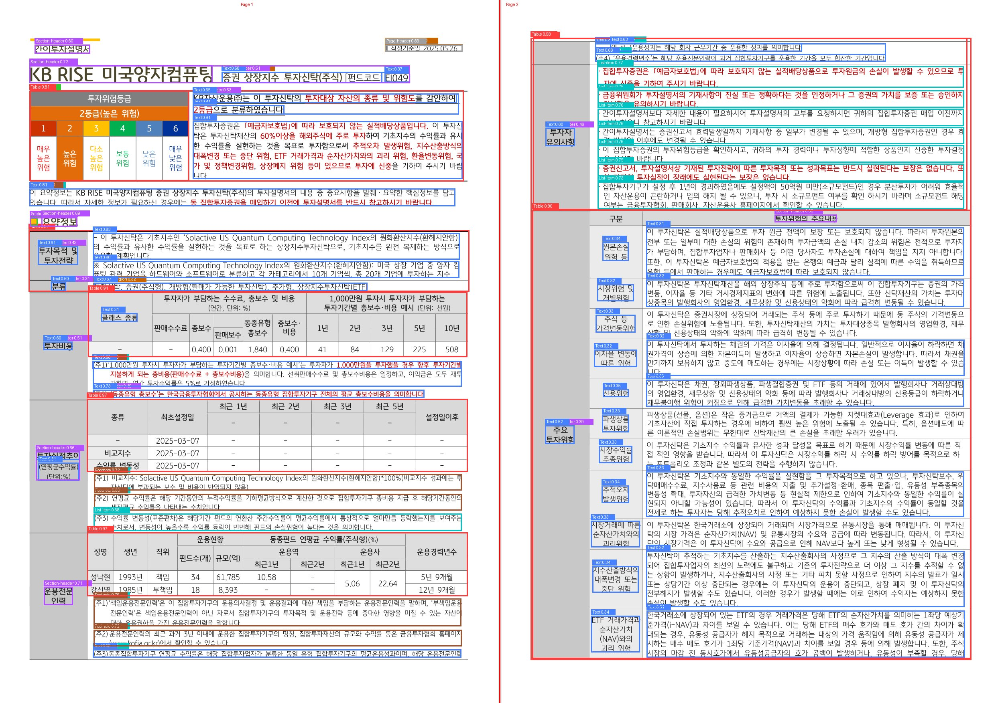

     테이블: 페이지1=6개, 페이지2=3개 → 합계 9개

  2️⃣  병합 이미지 감지


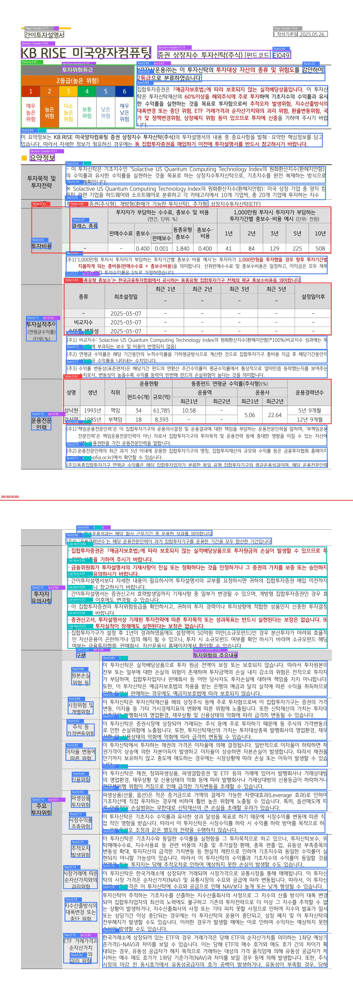

     테이블: 5개 감지
     ⚪ 경계 통과 테이블 없음

🔗 페이지 2+3

  1️⃣  원본 (페이지별 감지)


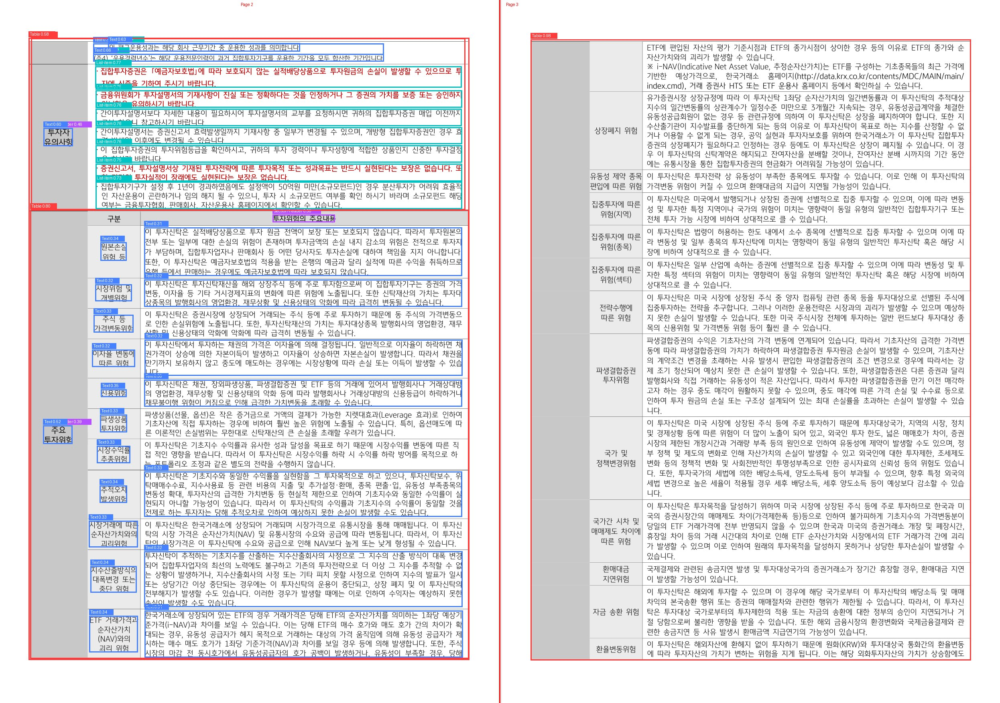

     테이블: 페이지2=3개, 페이지3=1개 → 합계 4개

  2️⃣  병합 이미지 감지


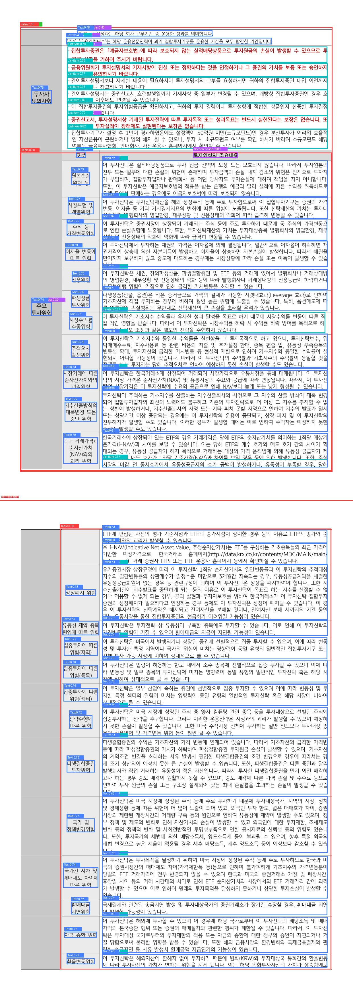

     테이블: 3개 감지
     ⚪ 경계 통과 테이블 없음

🔗 페이지 3+4

  1️⃣  원본 (페이지별 감지)


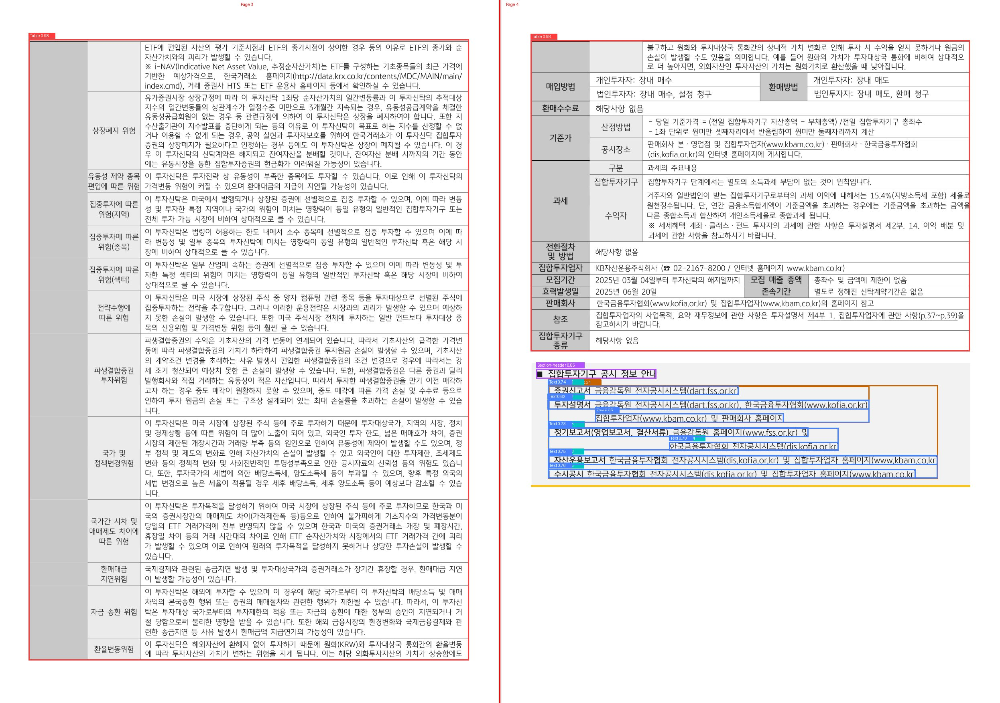

     테이블: 페이지3=1개, 페이지4=1개 → 합계 2개

  2️⃣  병합 이미지 감지


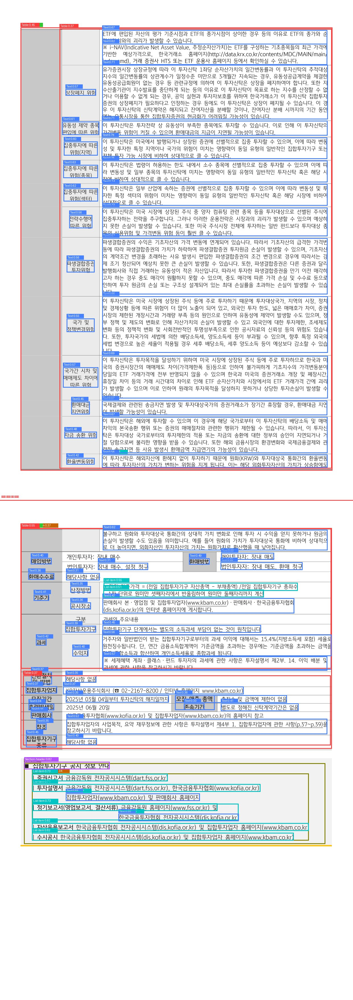

     테이블: 5개 감지
     ⚪ 경계 통과 테이블 없음


In [36]:
# 병합 이미지 시각화 + 원본과 테이블 비교
print('📊 원본 vs 병합 — 테이블 감지 비교 시각화')
print('=' * 80)

for pair in merged_pair_results:
    i = pair['page1_idx']
    label = pair['label']
    merged_img = pair['merged_img']
    preds = pair['preds']
    page1_h = pair['page1_h']
    total_h = pair['total_h']

    print(f'\n{"=" * 80}')
    print(f'🔗 {label}')
    print(f'{"=" * 80}')

    # ── 왼쪽: 원본 두 페이지 나란히 ──────────────────────────────────────────
    print('\n  1️⃣  원본 (페이지별 감지)')
    orig_tables_p1 = [p for p in all_predictions[i]     if 'Table' in p['label'] and p['confidence'] >= 0.3]
    orig_tables_p2 = [p for p in all_predictions[i + 1] if 'Table' in p['label'] and p['confidence'] >= 0.3]

    viz_p1 = draw_layout_predictions(page_images[i],     all_predictions[i],     min_confidence=0.3)
    viz_p2 = draw_layout_predictions(page_images[i + 1], all_predictions[i + 1], min_confidence=0.3)

    # 나란히 배치 (side-by-side)
    side_w = viz_p1.width + viz_p2.width + 10
    side_h = max(viz_p1.height, viz_p2.height)
    side_img = Image.new('RGB', (side_w, side_h), (240, 240, 240))
    side_img.paste(viz_p1, (0, 0))
    side_img.paste(viz_p2, (viz_p1.width + 10, 0))

    # 페이지 구분선 표시
    draw_side = ImageDraw.Draw(side_img)
    draw_side.line([(viz_p1.width + 4, 0), (viz_p1.width + 4, side_h)], fill=(255, 0, 0), width=3)
    draw_side.text((viz_p1.width // 2 - 20, 5),     f'Page {i+1}',   fill=(255,  0,  0))
    draw_side.text((viz_p1.width + 20, 5),           f'Page {i+2}',   fill=(255,  0,  0))

    side_path = viz_dir / f'compare_{i+1}_{i+2}_original.jpg'
    side_img.save(side_path, 'JPEG', quality=85)
    display(IPImage(filename=str(side_path), width=800))
    print(f'     테이블: 페이지{i+1}={len(orig_tables_p1)}개, 페이지{i+2}={len(orig_tables_p2)}개 → 합계 {len(orig_tables_p1)+len(orig_tables_p2)}개')

    # ── 오른쪽: 병합 이미지 감지 ────────────────────────────────────────────
    print('\n  2️⃣  병합 이미지 감지')
    viz_merged = draw_layout_predictions(merged_img, preds, min_confidence=0.3)

    # 페이지 경계선 표시
    draw_m = ImageDraw.Draw(viz_merged)
    draw_m.line([(0, page1_h), (merged_img.width, page1_h)], fill=(255, 0, 0), width=2)
    draw_m.text((5, page1_h - 18), '─── 페이지 경계 ───', fill=(255, 0, 0))

    merged_path = viz_dir / f'compare_{i+1}_{i+2}_merged.jpg'
    viz_merged.save(merged_path, 'JPEG', quality=85)
    display(IPImage(filename=str(merged_path), width=800))

    merged_tables = [p for p in preds if 'Table' in p['label'] and p['confidence'] >= 0.3]
    cross_tables  = [p for p in merged_tables if p['t'] < page1_h and p['b'] > page1_h]

    print(f'     테이블: {len(merged_tables)}개 감지')
    if cross_tables:
        print(f'     ✅ 경계 통과 테이블: {len(cross_tables)}개 → Cross-page 테이블 확인!')
    else:
        print(f'     ⚪ 경계 통과 테이블 없음')

In [37]:
# 최종 요약: 원본 vs 병합 테이블 감지 비교표
print('📋 최종 비교 요약')
print('=' * 80)

import pandas as pd

rows = []
for pair in merged_pair_results:
    i = pair['page1_idx']
    preds = pair['preds']
    page1_h = pair['page1_h']

    orig_t1 = len([p for p in all_predictions[i]     if 'Table' in p['label'] and p['confidence'] >= 0.3])
    orig_t2 = len([p for p in all_predictions[i + 1] if 'Table' in p['label'] and p['confidence'] >= 0.3])
    merged_t = len([p for p in preds if 'Table' in p['label'] and p['confidence'] >= 0.3])
    cross_t  = len([p for p in preds if 'Table' in p['label'] and p['confidence'] >= 0.3
                    and p['t'] < page1_h and p['b'] > page1_h])

    rows.append({
        '페이지 쌍':        pair['label'],
        '원본 테이블 합':   orig_t1 + orig_t2,
        '병합 테이블':      merged_t,
        '경계 통과 테이블': cross_t,
        '효과':            '✅ Cross-page 확인!' if cross_t > 0 else ('📉 감소' if merged_t < orig_t1 + orig_t2 else '변화 없음'),
    })

df_summary = pd.DataFrame(rows)
display(df_summary)

# 결론
total_cross = sum(r['경계 통과 테이블'] for _, r in df_summary.iterrows())
print()
if total_cross > 0:
    print(f'✅ 총 {total_cross}개 cross-page 테이블이 병합 이미지에서 감지됨!')
    print(f'   → 2페이지 병합 방식이 LayoutPredictor 수준에서도 효과적입니다.')
else:
    print(f'⚪ 경계 통과 테이블 없음')
    print(f'   → 이 PDF에는 cross-page 테이블이 없거나, LayoutPredictor가 감지 못함')
    print(f'   → table_merger (마크다운 후처리)로 보완 가능')

📋 최종 비교 요약


,페이지 쌍,원본 테이블 합,병합 테이블,경계 통과 테이블,효과
0,페이지 1+2,9,5,0,📉 감소
1,페이지 2+3,4,3,0,📉 감소
2,페이지 3+4,2,5,0,변화 없음



⚪ 경계 통과 테이블 없음
   → 이 PDF에는 cross-page 테이블이 없거나, LayoutPredictor가 감지 못함
   → table_merger (마크다운 후처리)로 보완 가능
